# 11. SABER amplified tag cell pellet quantification
## 1. Summary
This notebook quantifies channel features and generates the figures associated with the XRF epithelial cell pellet scans labelled with SABER amplified metal tags in Figure 5 of the MEZ-XRF paper.

Compared to 7b, this notebook seperates the standard and SABERx2 Z-tags. 

This includes quantifying cell features per channel using the image stack and according to the cell and nuclei segmentation masks generated in the `10_XRF_SABER_cell_segmentation` notebook. Both the image stack and masks are held in the hdf outputs of notebook 10.

In [1]:
import pathlib
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import squidpy as sq

import h5py
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
from shutil import copyfile

import sys
sys.path.insert(0, '..\\code\\')
import high_plex_hdf as hph
import hph_adata_analysis as hph_adata

In [2]:
# Set data directory to work from 
base_dir = "C:/Users/MerrickS/OneDrive/Work/2_UZH/Papers/1_MEZ_XRF"
base_dir = pathlib.Path(base_dir)
base_dir_sub = base_dir / 'data' / 'processed' / 'xrf'

# Identify analysis directory
analysis_dir = base_dir / 'data' / 'analysis' / 'xrf'

# Specify the input directory containing hdf deconvoluted files
deconv_dir = base_dir_sub / '2_deconvoluted_hdfs' / 'summary_hdfs'

# Specify the input directory containing hdf files of images and masks
hdf_dir = analysis_dir / '10_XRF_SABER_cell_segmentation'

# Make output directory segmented images
out_dir = analysis_dir / '11_XRF_SABER_cell_pellet_quantification'
out_dir.mkdir(parents=True, exist_ok=True)
print('Quantified hdf files will be output to: \n\t', out_dir) 

# Read in scans and original scan metadata
df_hdf_files = pd.read_csv(base_dir_sub / '1_reduced_reshaped_hdfs' / 'preprocessed_hdf_config_files.csv')
df_hdf_metadata = pd.read_csv(base_dir_sub / '1_reduced_reshaped_hdfs' / 'xrf_scan_metadata_full.csv')

# Import periodic table csv
df_periodic_table = pd.read_csv(base_dir / 'data' / 'raw' / 'xrf' / 'Periodic Table of Elements.csv')

Quantified hdf files will be output to: 
	 C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\analysis\xrf\11_XRF_SABER_cell_pellet_quantification


Identifiy the hdf files to analyse

In [3]:
samples_dict_1500Hz = {
    'sp_cp_zr751_1500Hz_0002': 'ZR-75-1 1500 Hz',
    'sp_cp_mcf10a_1500Hz_0001': 'MCF10a 1500 Hz',
    'sp_cp_a431real_1500Hz_0001': 'A431 1500 Hz',
    'sp_cp_skbr3_1500Hz_0002': 'SKBR3 1500 Hz',
    }
hdf_filepaths_1500Hz = []
for sample in samples_dict_1500Hz:
    hdf_filepaths_1500Hz.append(list(hdf_dir.glob(f'{sample}*.h5'))[0])

samples_dict_SKBR3 = {
    'sp_cp_column1_10Hz_0002': 'SKBR3 10 Hz',
    'sp_cp_column1_50Hz_0002': 'SKBR3 50 Hz',
    'sp_cp_column1_250Hz_0002': 'SKBR3 250 Hz',
    'sp_cp_skbr3_500Hz_0001': 'SKBR3 500 Hz',
    'sp_tt_skbr3_800Hz_0001': 'SKBR3 800 Hz',
    'sp_tt_skbr3_1000Hz_0001': 'SKBR3 1000 Hz',
    'sp_cp_skbr3_1500Hz_0002': 'SKBR3 1500 Hz',
    }
hdf_filepaths_SKBR3 = []
for sample in samples_dict_SKBR3:
    hdf_filepaths_SKBR3.append(list(hdf_dir.glob(f'{sample}*.h5'))[0])
    
cell_pellet_standard = {
    'st_cp_column2_aglfxd_10Hz_0001': 'ZR-75-1 10 Hz',
    'st_cp_column2_aglfxd_50Hz_0001': 'ZR-75-1 50 Hz',
    'st_cp_column2_angle_250Hz_0001': 'ZR-75-1 250 Hz',
    'st_cp_1_column1_10Hz_0001': 'MCF10a 10 Hz',
    'st_cp_column1_50Hz_0001': 'MCF10a 50 Hz',
    'st_cp_column1_250Hz_0001': 'MCF10a 250 Hz',
    'st_cp_column2_aglfxd_2_10Hz_0001': 'A431 10 Hz',
    'st_cp_column2_aglfxd_50Hz_0002': 'A431 50 Hz',
    'st_cp_column2_angle_250Hz_0002': 'A431 250 Hz',
    'st_cp_1_column1_10Hz_0002': 'SKBR3 10 Hz',
    'st_cp_column1_50Hz_0002': 'SKBR3 50 Hz',
    'st_cp_column1_250Hz_0002': 'SKBR3 250 Hz',
    }
hdf_filepaths_CPstandard = []
for sample in cell_pellet_standard:
    hdf_filepaths_CPstandard.append(list(hdf_dir.glob(f'{sample}*.h5'))[0])

cell_pellet_balance = {
    'bl_cp_column2_10Hz_0001': 'ZR-75-1 10 Hz',
    'bl_cp_column2_50Hz_0001': 'ZR-75-1 50 Hz',
    'bl_cp_column2_250Hz_0003': 'ZR-75-1 250 Hz',
    'bl_cp_column1_10Hz_0001': 'MCF10a 10 Hz',
    'bl_cp_column1_50Hz_0001': 'MCF10a 50 Hz',
    'bl_cp_column1_250Hz_0001': 'MCF10a 250 Hz',
    'bl_cp_column2_10Hz_0002': 'A431 10 Hz',
    'bl_cp_column2_50Hz_0002': 'A431 50 Hz',
    'bl_cp_column2_250Hz_0004': 'A431 250 Hz',
    'bl_cp_skbr3re_10Hz_0001': 'SKBR3 10 Hz',
    'bl_cp_skbr3re_50Hz_0001': 'SKBR3 50 Hz',
    'bl_cp_skbr3re_250Hz_0001': 'SKBR3 250 Hz',
}
hdf_filepaths_CPbalance = []
for sample in cell_pellet_balance:
    hdf_filepaths_CPbalance.append(list(hdf_dir.glob(f'{sample}*.h5'))[0])
    
cell_pellet_speed = {
    'sp_cp_column2_10Hz_0001':'ZR-75-1 10 Hz',
    'sp_cp_column2_50Hz_0001':'ZR-75-1 50 Hz',
    'sp_cp_column2_250Hz_0001':'ZR-75-1 250 Hz',
    'sp_cp_a431_500Hz_0001':'ZR-75-1 500 Hz',
    'sp_cp_a431_800Hz_0001':'ZR-75-1 800 Hz',
    'sp_cp_a431_1000Hz_0001':'ZR-75-1 1000 Hz',
    'sp_cp_zr751_1500Hz_0002':'ZR-75-1 1500 Hz',
    'sp_cp_column1_10Hz_0001':'MCF10a 10 Hz',
    'sp_cp_column1_50Hz_0001':'MCF10a 50 Hz',
    'sp_cp_column1_250Hz_0001':'MCF10a 250 Hz',
    'sp_cp_mcf10a_500Hz_0001':'MCF10a 500 Hz',
    'sp_cp_mcf10a_800Hz_0001':'MCF10a 800 Hz',
    'sp_cp_mcf10a_1000Hz_0001':'MCF10a 1000 Hz',
    'sp_cp_mcf10a_1500Hz_0001':'MCF10a 1500 Hz',
    'sp_cp_column2_10Hz_0002':'A431 10 Hz',
    'sp_cp_column2_50Hz_0002':'A431 50 Hz',
    'sp_cp_column2_250Hz_0002':'A431 250 Hz',
    'sp_cp_a431real_500Hz_0001':'A431 500 Hz',
    'sp_cp_a431real_800Hz_0001':'A431 800 Hz',
    'sp_cp_a431real_1000Hz_0001':'A431 1000 Hz',
    'sp_cp_a431real_1500Hz_0001':'A431 1500 Hz',
    'sp_cp_column1_10Hz_0002':'SKBR3 10 Hz',
    'sp_cp_column1_50Hz_0002':'SKBR3 50 Hz',
    'sp_cp_column1_250Hz_0002':'SKBR3 250 Hz',
    'sp_cp_skbr3_500Hz_0001':'SKBR3 500 Hz',
    'sp_tt_skbr3_800Hz_0001':'SKBR3 800 Hz',
    'sp_tt_skbr3_1000Hz_0001':'SKBR3 1000 Hz',
    'sp_cp_skbr3_1500Hz_0002':'SKBR3 1500 Hz',
    }
hdf_filepaths_CPspeed = []
for sample in cell_pellet_speed:
    hdf_filepaths_CPspeed.append(list(hdf_dir.glob(f'{sample}*.h5'))[0])   
        
    
TMA_balance = {
    'bl_tt_h2_inset_10Hz_0002' : 'h2',
    'bl_tt_h2_50Hz_0001' : 'h2',
    'bl_tt_h2_250Hz_0001' : 'h2',
    'bl_tt_lb2_inset1_10Hz_0001' : 'lb2',
    'bl_tt_lb2_50Hz_0001' : 'lb2',
    'bl_tt_lb2_250Hz_0001' : 'lb2',
    'bl_tt_lbh4_inset_10Hz_0001' : 'lbh4',
    'bl_tt_lbh4_50Hz_0001' : 'lbh4',
    'bl_tt_lbh4_250Hz_0001' : 'lbh4',
}
hdf_filepaths_TMAbalance = []
for sample in TMA_balance:
    hdf_filepaths_TMAbalance.append(list(hdf_dir.glob(f'{sample}*.h5'))[0])

# Change this if want to switch sample dictionary
hdf_filepaths = hdf_filepaths_1500Hz    

In [4]:
for hdf_fpath in hdf_filepaths[:1]:
    with h5py.File(hdf_fpath, 'r') as hdf:
        print(hdf['images'].keys())
        print(hdf['masks'].keys())

<KeysViewHDF5 ['1_compton_norm', '2_beam_intensity_norm', 'df_channel_metadata', 'raw']>
<KeysViewHDF5 ['fpico_mask', 'matched_cell_mask', 'matched_non_nuclei_mask', 'matched_nuclei_mask', 'mesmer_cell_mask', 'mesmer_nuclei_mask']>


## 2. Generate annotated data (anndata) objects based on selected image set and selected masks
Create a merged anndata object of using whole cell, nuclear and non-nuclear masks for the cell pellet set of hdf files.

In [5]:
image_n = '2_beam_intensity_norm'

mask_n = 'matched_cell_mask'
adata_1500Hz = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_1500Hz.write(out_dir.joinpath('cell_pellets_1500Hz_adata_matched_cell.h5ad'))

mask_n = 'matched_nuclei_mask'
adata_1500Hz = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_1500Hz.write(out_dir.joinpath('cell_pellets_1500Hz_adata_matched_nuclei.h5ad'))

mask_n = 'matched_non_nuclei_mask'
adata_1500Hz = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_1500Hz.write(out_dir.joinpath('cell_pellets_1500Hz_adata_matched_non_nuclei.h5ad'))

... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical


## 3. Generate channel summary images
Reference for each hdf image mask container is stored in the unstructured aspect of `anndata adata.uns['hdf_container_path']`. Images are imported from these hdf containers, which are index matched to variable annotations stored in `adata.var`.

In [6]:
plot_channels= [
    'Ag_Ka', 
    'Ce_Ka', 
    'Dy_Ka', 
    'Er_L3', 
    'Eu_Ka', 
    'Gd_Ka', 
    'Ho_Ka', 
    'I_Ka',
    'In_Ka', 
    'Ir_L3', 
    'La_Ka', 
    'Lu_L3', 
    'Nd_Ka', 
    'Pr_Ka', 
    'Sm_Ka', 
    'Tb_Ka',
    'Tm_L3', 
    'Y_Ka', 
    'Yb_L3'
]

fig_channels_1= [
    'Gd_Ka'
    'Tb_Ka', 
    'Lu_Ka', 
]

fig_channels_2 = [
    'Ho_Ka', 
    #'Gd_Ka',
    'Dy_Ka',
]


In [7]:
adata_1500Hz.uns.keys

<bound method OverloadedDict.keys of OverloadedDict, wrapping:
	{'high_plex_hdf_paths': {'ZR-75-1 1500 Hz': ['C:\\', 'Users', 'MerrickS', 'OneDrive', 'Work', '2_UZH', 'Papers', '1_MEZ_XRF', 'data', 'analysis', 'xrf', '10_XRF_SABER_cell_segmentation', 'sp_cp_zr751_1500Hz_0002_normalised_segmented.h5'], 'MCF10a 1500 Hz': ['C:\\', 'Users', 'MerrickS', 'OneDrive', 'Work', '2_UZH', 'Papers', '1_MEZ_XRF', 'data', 'analysis', 'xrf', '10_XRF_SABER_cell_segmentation', 'sp_cp_mcf10a_1500Hz_0001_normalised_segmented.h5'], 'A431 1500 Hz': ['C:\\', 'Users', 'MerrickS', 'OneDrive', 'Work', '2_UZH', 'Papers', '1_MEZ_XRF', 'data', 'analysis', 'xrf', '10_XRF_SABER_cell_segmentation', 'sp_cp_a431real_1500Hz_0001_normalised_segmented.h5'], 'SKBR3 1500 Hz': ['C:\\', 'Users', 'MerrickS', 'OneDrive', 'Work', '2_UZH', 'Papers', '1_MEZ_XRF', 'data', 'analysis', 'xrf', '10_XRF_SABER_cell_segmentation', 'sp_cp_skbr3_1500Hz_0002_normalised_segmented.h5']}}
With overloaded keys:
	['neighbors'].>

In [8]:
from pathlib import Path
import h5py
hdf_path = Path(*adata_1500Hz.uns['high_plex_hdf_paths']['MCF10a 1500 Hz'])

with h5py.File(hdf_path, 'r') as hdf:
    complete_channels_df = pd.read_hdf(hdf_path, key='images/df_channel_metadata')

In [9]:
complete_channels_df[complete_channels_df['shortname'].isin(['Gd_Ka'])]

,plot_channel,ab_tag,tag_isotope,xrf_emission,target,saber_rounds,shortname,ab_clone,stock_conc_ug_per_ml,use_conc_ug_per_mL,nuclear_segment,cell_segment


In [10]:
adata_1500Hz.uns['high_plex_hdf_paths'].keys()

dict_keys(['ZR-75-1 1500 Hz', 'MCF10a 1500 Hz', 'A431 1500 Hz', 'SKBR3 1500 Hz'])

In [11]:
adata_1500Hz.var

,shortname,longname
Dy_Ka,CK7 (SABER x2),Dy_Ka | CK7 (SABER x2)
Gd_Ka,HER2 (SABER x2),Gd_Ka | HER2 (SABER x2)
Ho_Ka,CK5 (SABER x2),Ho_Ka | CK5 (SABER x2)
I_Ka,IdU,I_Ka | IdU
Ir_L3,DNA,Ir_L3 | DNA
La_Ka,PR (SABER x2),La_Ka | PR (SABER x2)
Lu_Ka,Vim (SABER x2),Lu_Ka | Vim (SABER x2)
Pr_Ka,Ki-67 (SABER x2),Pr_Ka | Ki-67 (SABER x2)
Rh_Ka,DNA,Rh_Ka | DNA
Sm_Ka,HH3 (SABER x2),Sm_Ka | HH3 (SABER x2)


C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\analysis\xrf\11_XRF_SABER_cell_pellet_quantification\Fig4N-Q.pdf


..\code\hph_adata_analysis.py:395: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(tick_labels_padded)  # vertically oriented colorbar


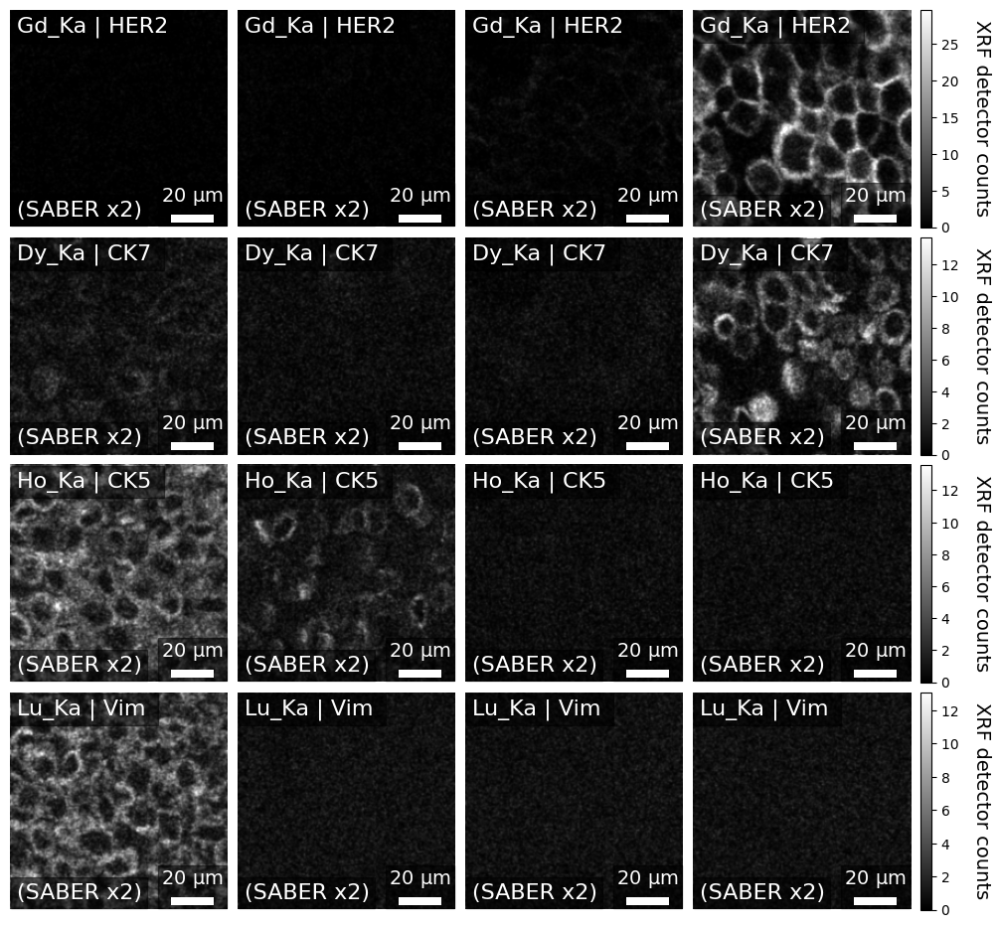

In [12]:
save_name = str(out_dir / 'Fig4N-Q.pdf')
print(save_name)

hph_adata.adata_hph_channels_plot(
    adata_1500Hz, 
    plot_name='longname', 
    plot_name_split='(',
    plot_channels= [
        'Gd_Ka',
        'Dy_Ka',
        'Ho_Ka',
        'Lu_Ka',
    ],
    hdf_ids = [
        'MCF10a 1500 Hz',
        'A431 1500 Hz',
        'ZR-75-1 1500 Hz',
        'SKBR3 1500 Hz'         
    ],
    hdf_image_key='raw',
    scale_length=20,
    legend_fontsize=16,
    save_name = save_name
)

..\code\hph_adata_analysis.py:395: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(tick_labels_padded)  # vertically oriented colorbar


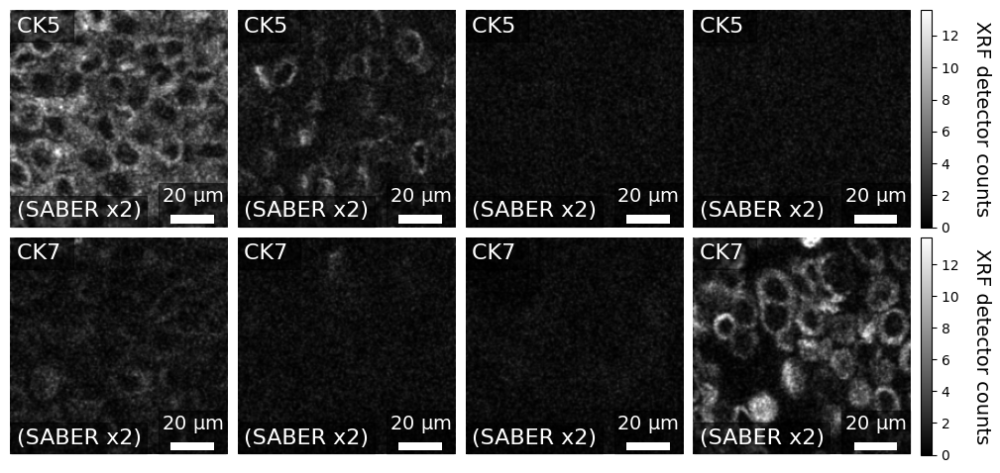

In [13]:
hph_adata.adata_hph_channels_plot(
    adata_1500Hz, 
    plot_name='shortname', 
    plot_name_split='(',
    plot_channels=fig_channels_2,
    hdf_ids = [
        'MCF10a 1500 Hz',
        'A431 1500 Hz',
        'ZR-75-1 1500 Hz',
        'SKBR3 1500 Hz'         
    ],
    hdf_image_key='raw',
    scale_length=20,
    legend_fontsize=16    
)

In [14]:
# Switch to SKBR3 images at different rates
hdf_filepaths = hdf_filepaths_SKBR3   
for hdf_fpath in hdf_filepaths[:1]:
    with h5py.File(hdf_fpath, 'r') as hdf:
        print(hdf['images'].keys())
        print(hdf['masks'].keys())

<KeysViewHDF5 ['1_compton_norm', '2_beam_intensity_norm', 'df_channel_metadata', 'raw']>
<KeysViewHDF5 ['fpico_mask', 'matched_cell_mask', 'matched_non_nuclei_mask', 'matched_nuclei_mask', 'mesmer_cell_mask', 'mesmer_nuclei_mask']>


In [15]:
image_n = '2_beam_intensity_norm'

mask_n = 'matched_cell_mask'
adata_SKBR3 = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_SKBR3.write(out_dir.joinpath('SKBR3_speed_comparison_adata_matched_cell.h5ad'))

mask_n = 'matched_nuclei_mask'
adata_SKBR3 = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_SKBR3.write(out_dir.joinpath('SKBR3_speed_comparison_adata_matched_nuclei.h5ad'))

mask_n = 'matched_non_nuclei_mask'
adata_SKBR3 = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_SKBR3.write(out_dir.joinpath('SKBR3_speed_comparison_adata_matched_non_nuclei.h5ad'))

... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical


In [16]:
adata_SKBR3.uns['high_plex_hdf_paths'].keys()

dict_keys(['SKBR3 10 Hz', 'SKBR3 50 Hz', 'SKBR3 250 Hz', 'SKBR3 500 Hz', 'SKBR3 800 Hz', 'SKBR3 1000 Hz', 'SKBR3 1500 Hz'])

In [17]:
list(adata_SKBR3.var.index)

['Dy_Ka',
 'Gd_Ka',
 'Ho_Ka',
 'I_Ka',
 'Ir_L3',
 'La_Ka',
 'Lu_Ka',
 'Pr_Ka',
 'Rh_Ka',
 'Sm_Ka',
 'Tb_Ka',
 'Tm_Ka']

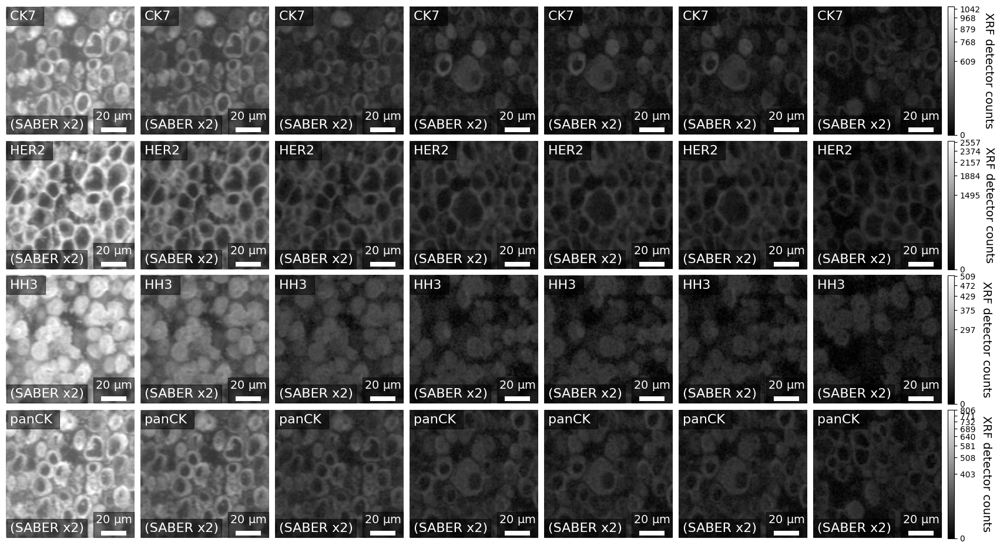

In [18]:
hph_adata.adata_hph_channels_plot(
    adata_SKBR3, 
    plot_name='shortname', 
    plot_name_split='(',
    plot_channels=[
        'Dy_Ka',
        'Gd_Ka',
        'Sm_Ka',
        'Tb_Ka',
    ],
    hdf_ids = [
        'SKBR3 10 Hz',
        'SKBR3 50 Hz',
        'SKBR3 250 Hz',
        'SKBR3 500 Hz',
        'SKBR3 800 Hz',
        'SKBR3 1000 Hz',        
        'SKBR3 1500 Hz',        
    ],
    hdf_image_key='raw',
    scale_length=20,
    legend_fontsize=16,
    power=3
)

## 4. Cell pellet standard panel analysis

In [19]:
# Create cell pellet standard adata
hdf_filepaths = hdf_filepaths_CPstandard
for hdf_fpath in hdf_filepaths[:1]:
    with h5py.File(hdf_fpath, 'r') as hdf:
        print(hdf['images'].keys())
        print(hdf['masks'].keys())
        
image_n = '2_beam_intensity_norm'

mask_n = 'matched_cell_mask'
adata_CPstandard = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_CPstandard.write(out_dir.joinpath(f'cell_pellet_standard_{mask_n}.h5ad'))

mask_n = 'matched_nuclei_mask'
adata_CPstandard = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_CPstandard.write(out_dir.joinpath(f'cell_pellet_standard_{mask_n}.h5ad'))

mask_n = 'matched_non_nuclei_mask'
adata_CPstandard = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_CPstandard.write(out_dir.joinpath(f'cell_pellet_standard_{mask_n}.h5ad'))


<KeysViewHDF5 ['1_compton_norm', '2_beam_intensity_norm', 'df_channel_metadata', 'raw']>
<KeysViewHDF5 ['fpico_mask', 'matched_cell_mask', 'matched_non_nuclei_mask', 'matched_nuclei_mask', 'mesmer_cell_mask', 'mesmer_nuclei_mask']>


... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical


In [20]:
# Standard panel signal to noise of HER2 channel between SKBR3 and MCF10a cells
(np.mean(adata_CPstandard[:, 'Nd_Ka'][adata_CPstandard.obs['sample_name_ref'] == 'SKBR3 10 Hz'].X) / 
np.mean(adata_CPstandard[:, 'Nd_Ka'][adata_CPstandard.obs['sample_name_ref'] == 'MCF10a 10 Hz'].X))


C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


ArrayView(2.2483473, dtype=float32)

In [21]:
adata_CPstandard.var

,shortname,longname
Dy_Ka,CK7,Dy_Ka | CK7
Ho_Ka,HH3,Ho_Ka | HH3
I_Ka,IdU,I_Ka | IdU
Ir_L3,DNA,Ir_L3 | DNA
La_Ka,PR,La_Ka | PR
Lu_Ka,panCK,Lu_Ka | panCK
Nd_Ka,HER2,Nd_Ka | HER2
Pr_Ka,Ki-67,Pr_Ka | Ki-67
Rh_Ka,DNA,Rh_Ka | DNA
Tb_Ka,CK5,Tb_Ka | CK5


C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\analysis\xrf\11_XRF_SABER_cell_pellet_quantification\Fig4B-F.pdf


..\code\hph_adata_analysis.py:395: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(tick_labels_padded)  # vertically oriented colorbar


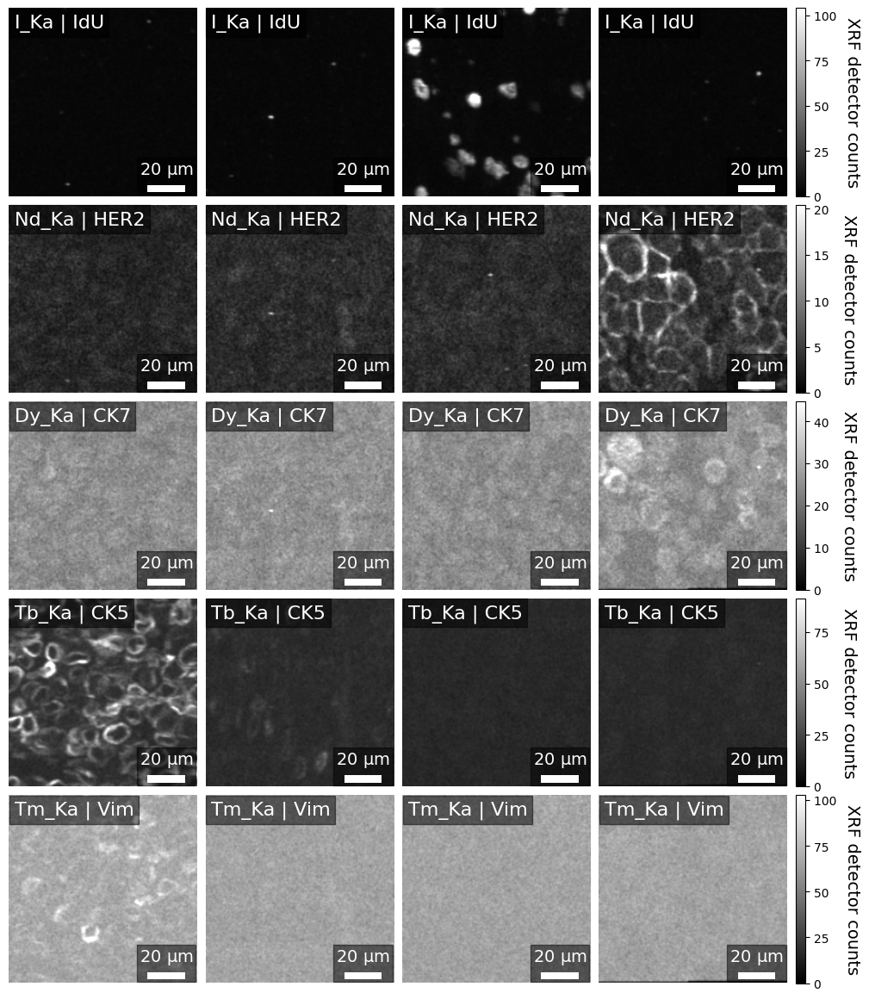

..\code\hph_adata_analysis.py:395: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(tick_labels_padded)  # vertically oriented colorbar


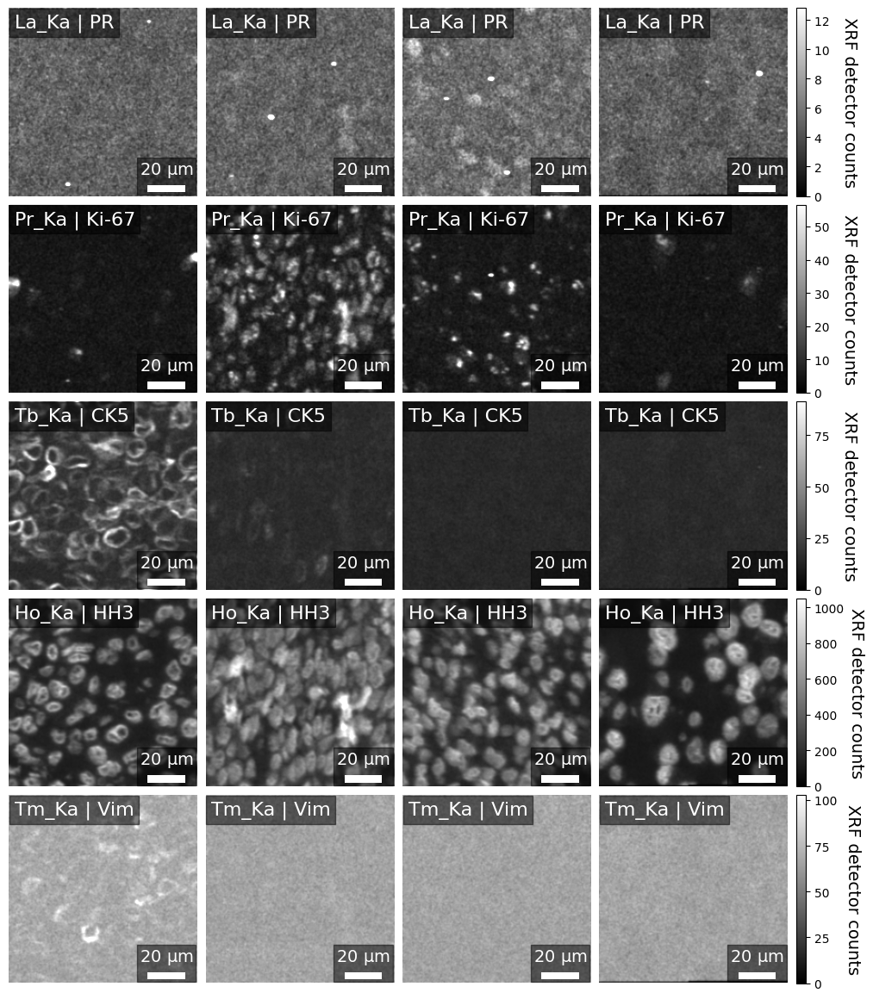

In [22]:
fig_channels_1= [
    'I_Ka',
    'Nd_Ka', 
    'Dy_Ka',
    'Tb_Ka',
    'Tm_Ka',
]

sup_channels = [
    #'I_Ka',
    'La_Ka',
    'Pr_Ka',
    #'Nd_Ka',
    'Tb_Ka',
#     'Dy_Ka',
    'Ho_Ka',
    'Tm_Ka',

]

save_name = str(out_dir / 'Fig4B-F.pdf')
print(save_name)

hph_adata.adata_hph_channels_plot(
    adata_CPstandard, 
    plot_name='longname', 
#     plot_name_split='(',
    plot_channels=fig_channels_1,
    hdf_ids = [
        'MCF10a 10 Hz',
        'A431 10 Hz',
        'ZR-75-1 10 Hz',
        'SKBR3 10 Hz',
    ],
    hdf_image_key='raw',
    scale_length=20,
    legend_fontsize=16,
    save_name=save_name
    #power=2,
    #ticks = [1, 8, 16] # CARRY ON HERE, CAN SPECIFY TICKS NOW
)

hph_adata.adata_hph_channels_plot(
    adata_CPstandard, 
    plot_name='longname', 
#     plot_name_split='(',
    plot_channels=sup_channels,
    hdf_ids = [
        'MCF10a 10 Hz',
        'A431 10 Hz',
        'ZR-75-1 10 Hz',
        'SKBR3 10 Hz',
    ],
    hdf_image_key='raw',
    scale_length=20,
    legend_fontsize=16,
    #power=2,
    #ticks = [1, 8, 16] # CARRY ON HERE, CAN SPECIFY TICKS NOW
)

## 5. Calculating signal to noise

<KeysViewHDF5 ['1_compton_norm', '2_beam_intensity_norm', 'df_channel_metadata', 'raw']>
<KeysViewHDF5 ['fpico_mask', 'matched_cell_mask', 'matched_non_nuclei_mask', 'matched_nuclei_mask', 'mesmer_cell_mask', 'mesmer_nuclei_mask']>


... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'Hz' as categorical
... storing 'shortname' as categorical
C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.obs` of view, copying.


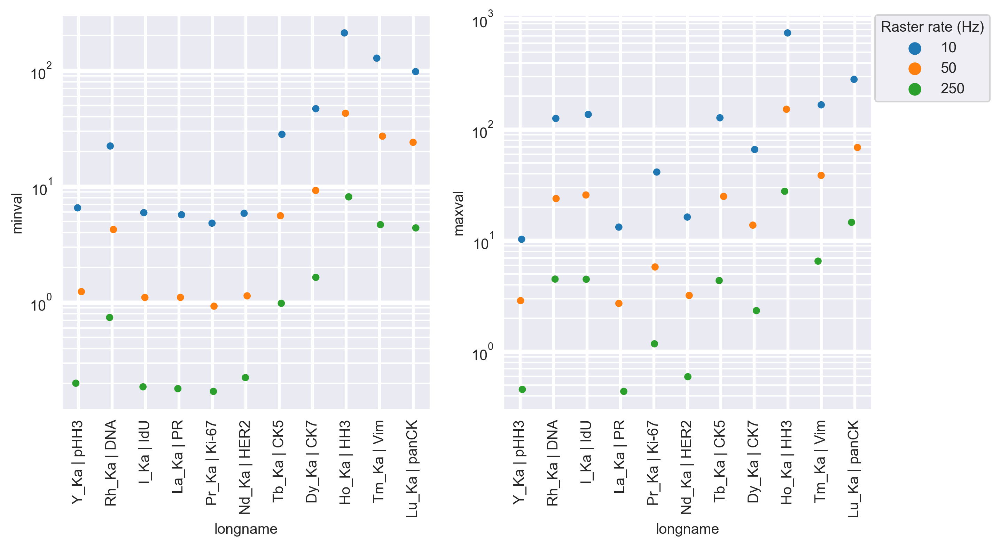

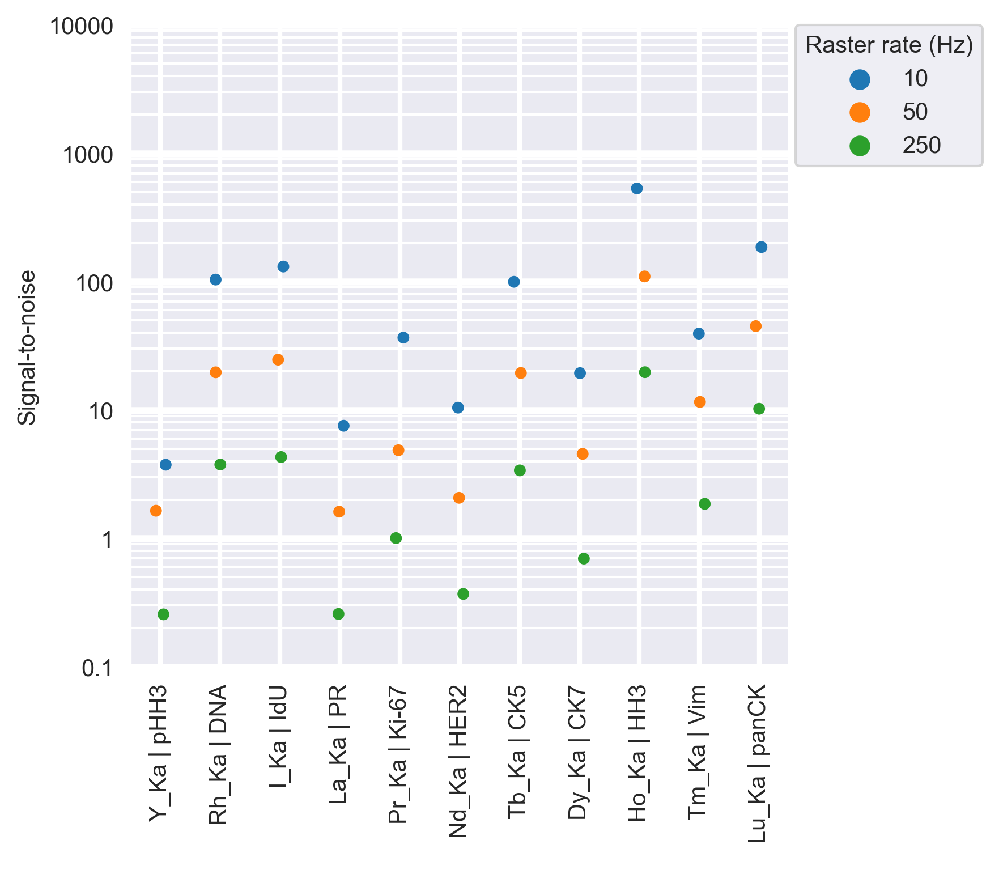

In [23]:
# Create cell pellet standard adata
hdf_filepaths = hdf_filepaths_CPstandard
for hdf_fpath in hdf_filepaths[:1]:
    with h5py.File(hdf_fpath, 'r') as hdf:
        print(hdf['images'].keys())
        print(hdf['masks'].keys())
        
image_n = 'raw'
mask_n = 'matched_cell_mask'
adata = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata.obs['Hz'] = adata.obs['hph_id'].str.split(' ', expand=True).iloc[:,-2]
adata.write(out_dir.joinpath(f'cell_pellet_standard_for_signal_to_noise_{mask_n}.h5ad'))


adata_var_select = [var_name for var_name in adata.var_names if var_name != 'Ir_L3']
adata = adata[:, adata_var_select]
adata.obs['Hz'] = adata.obs['hph_id'].str.split(' ', expand=True).iloc[:,-2]#rename(columns = )


df_to_map = adata.var
df_to_map['var_name'] = df_to_map.index
df_to_map[['Symbol', 'Edge']] = df_to_map['var_name'].str.split('_', expand=True).rename(columns={0:'Symbol', 1:'Edge'})
df_to_map = pd.merge(df_to_map, df_periodic_table[['AtomicNumber', 'Element', 'Symbol']], on='Symbol')

df_signal_to_noise = pd.DataFrame()
for hz in adata.obs['Hz'].unique():
    row = {}
    row['Hz'] = hz
    adata_Hz = adata[adata.obs['Hz'] == hz]
    for var_name in adata_Hz.var_names:
        row['var_name'] = var_name

        var_values = adata_Hz[:,var_name].X

        # Sample the max and mean signal in top and bottom (specified) % of cells
        non_zero_values = sorted(var_values[np.nonzero(var_values)])
        percentage = 5
        cell_sample = int(len(non_zero_values) / 100) * percentage
        row['minval'] = np.mean(non_zero_values[:cell_sample])
        row['maxval'] = np.max(non_zero_values[-cell_sample:])

        # Add rows to dataframe
        if df_signal_to_noise.empty:
            df_signal_to_noise = pd.DataFrame(columns=row.keys())            
        df_signal_to_noise = df_signal_to_noise.append(row, ignore_index=True)
            
# Sort data types
df_signal_to_noise['var_name'] = df_signal_to_noise['var_name'].astype('category')
df_signal_to_noise['Hz'] = df_signal_to_noise['Hz'].astype('category')
df_signal_to_noise['minval'] = df_signal_to_noise['minval'].astype('float')
df_signal_to_noise['maxval'] = df_signal_to_noise['maxval'].astype('float')
# df_signal_to_noise['signal-to-noise'] = ((df_signal_to_noise['maxval'] / (df_signal_to_noise['maxval'] - df_signal_to_noise['minval'])) - 1) * 100
# df_signal_to_noise['signal-to-noise2'] = (df_signal_to_noise['maxval'] - (df_signal_to_noise['minval'])) / df_signal_to_noise['minval']
df_signal_to_noise['signal-to-noise'] = (df_signal_to_noise['maxval'] - (df_signal_to_noise['minval']))
df_signal_to_noise = pd.merge(df_signal_to_noise, df_to_map, on='var_name')


# Set seaborn
from matplotlib.ticker import ScalarFormatter
import matplotlib.ticker as ticker

sns.set_style("dark")

### Check max and min values
fig, axs = plt.subplots(ncols = 2, figsize=(10,5), dpi=300)

g = sns.stripplot(
    data = df_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'minval',
    hue='Hz',
    hue_order = ['10', '50', '250'],    ax=axs[0],
)
axs[0].tick_params(axis='x', rotation=90)

# Set scale
g.set(yscale="log")
#Set gridlines
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')

g = sns.stripplot(
    data = df_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'maxval',
    hue='Hz',
    hue_order = ['10', '50', '250'],    ax=axs[1],
)
axs[1].tick_params(axis='x', rotation=90)


# Set scale
g.set(yscale="log")
#Set gridlines
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')

# Sort shared legend
axs[0].get_legend().remove()
axs[1].get_legend().remove()
plt.legend(title='Raster rate (Hz)', bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=90)#, ha='right')
plt.show()

### Plot signal to noise
fig, ax = plt.subplots(figsize=(5,5), dpi=300)
g = sns.stripplot(
    data = df_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'signal-to-noise',
    hue='Hz',
    hue_order = ['10', '50', '250'],
    ax=ax
)
ax.set(yscale="log")
ax.set_ylim([0.1, 10000])
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')
plt.xticks(rotation=90)#, ha='right')
plt.ylabel('Signal-to-noise')
plt.xlabel(' ')
plt.legend(title='Raster rate (Hz)', bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.show()


## 6. Cell pellet speed panel analysis (SABERx2)

In [24]:
# Create cell pellet speed adata
hdf_filepaths = hdf_filepaths_CPspeed
for hdf_fpath in hdf_filepaths[:1]:
    with h5py.File(hdf_fpath, 'r') as hdf:
        print(hdf['images'].keys())
        print(hdf['masks'].keys())
        
image_n = 'raw'
mask_n = 'matched_cell_mask'
adata_CPspeed = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_CPspeed.write(out_dir.joinpath(f'cell_pellet_speed_{mask_n}.h5ad'))

mask_n = 'matched_nuclei_mask'
adata_CPspeed = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_CPspeed.write(out_dir.joinpath(f'cell_pellet_speed_{mask_n}.h5ad'))

mask_n = 'matched_non_nuclei_mask'
adata_CPspeed = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_CPspeed.write(out_dir.joinpath(f'cell_pellet_speed_{mask_n}.h5ad'))


<KeysViewHDF5 ['1_compton_norm', '2_beam_intensity_norm', 'df_channel_metadata', 'raw']>
<KeysViewHDF5 ['fpico_mask', 'matched_cell_mask', 'matched_non_nuclei_mask', 'matched_nuclei_mask', 'mesmer_cell_mask', 'mesmer_nuclei_mask']>


... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical


C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\analysis\xrf\11_XRF_SABER_cell_pellet_quantification\Fig4G-K.pdf


..\code\hph_adata_analysis.py:395: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(tick_labels_padded)  # vertically oriented colorbar


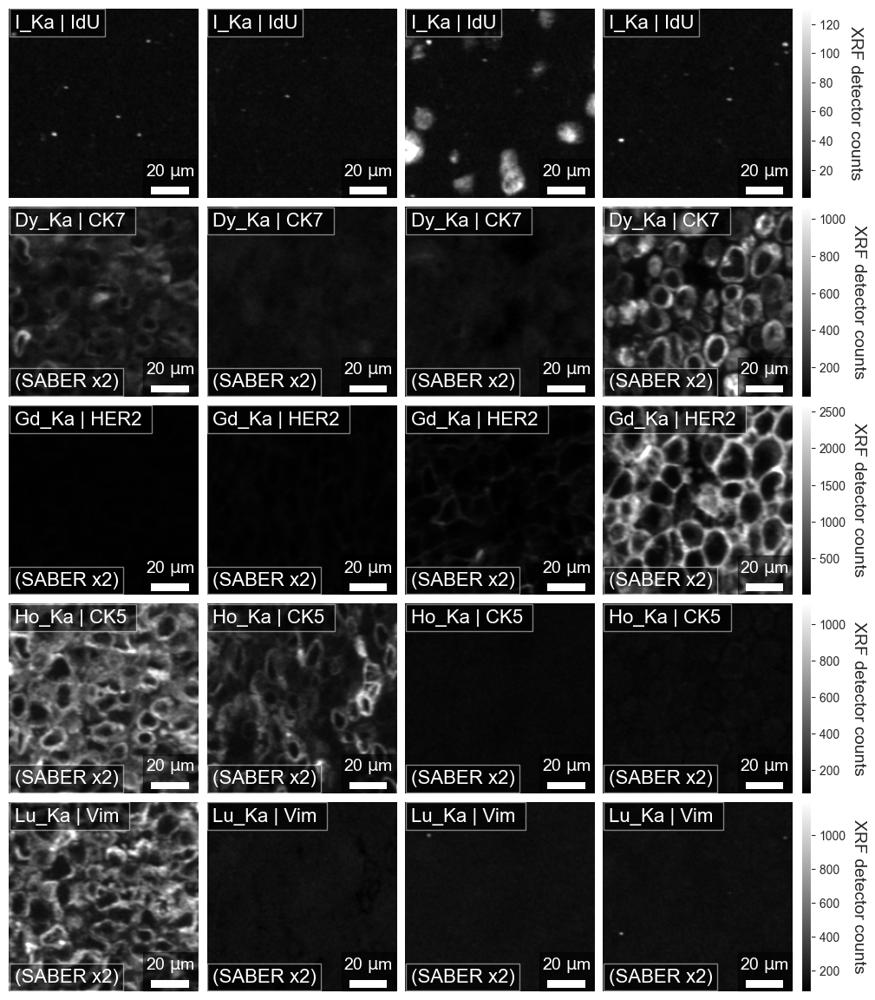

..\code\hph_adata_analysis.py:395: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(tick_labels_padded)  # vertically oriented colorbar


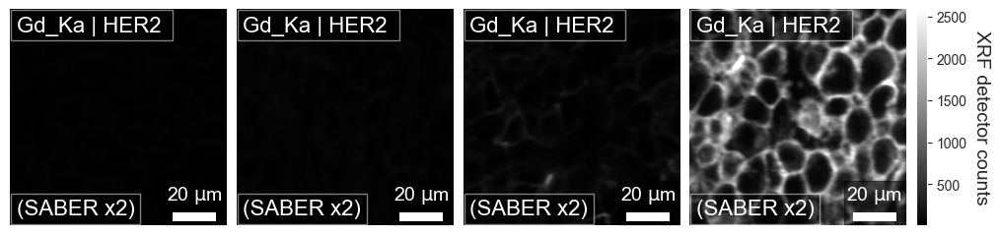

In [25]:
fig_4_speed =  [
    'I_Ka',
    'Gd_Ka',
    'Dy_Ka',
    'Ho_Ka',
    'Lu_Ka',
]

sup_channels_speed =  [
    'La_Ka',
    'Pr_Ka',
    'Ho_Ka',
#     'Dy_Ka',
    'Sm_Ka',
    'Lu_Ka',
]

save_name = str(out_dir / 'Fig4G-K.pdf')
print(save_name)

hph_adata.adata_hph_channels_plot(
    adata_CPspeed, 
    plot_name='longname', 
    plot_name_split='(',
    plot_channels=fig_4_speed,
    hdf_ids = [
        'MCF10a 10 Hz',
        'A431 10 Hz',
        'ZR-75-1 10 Hz',
        'SKBR3 10 Hz',     
    ],
    hdf_image_key='raw',
    scale_length=20,
    legend_fontsize=16,
    save_name=save_name
    #power=2
)

hph_adata.adata_hph_channels_plot(
    adata_CPspeed, 
    plot_name='longname', 
    plot_name_split='(',
    plot_channels=['Gd_Ka'],
    hdf_ids = [
        'MCF10a 10 Hz',
        'A431 10 Hz',
        'ZR-75-1 10 Hz',
        'SKBR3 10 Hz',     
    ],
    hdf_image_key='raw',
    scale_length=20,
    legend_fontsize=16,
    #power=2
)

In [26]:
# Balance panel signal to noise of HER2 channel between SKBR3 and MCF10a cells
(np.mean(adata_CPspeed[:, 'Gd_Ka'][adata_CPspeed.obs['sample_name_ref'] == 'SKBR3 10 Hz'].X) / 
 np.mean(adata_CPspeed[:, 'Gd_Ka'][adata_CPspeed.obs['sample_name_ref'] == 'MCF10a 10 Hz'].X))

C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


ArrayView(31.348953, dtype=float32)

In [27]:
adata_CPspeed.obs['sample_name_ref'] == 'ZR-75-1 10 Hz'

0-1       True
0-2       True
0-3       True
0-4       True
0-5       True
         ...  
27-55    False
27-58    False
27-59    False
27-61    False
27-62    False
Name: sample_name_ref, Length: 1679, dtype: bool

In [28]:
adata_CPspeed.uns['high_plex_hdf_paths']['SKBR3 10 Hz']

['C:\\',
 'Users',
 'MerrickS',
 'OneDrive',
 'Work',
 '2_UZH',
 'Papers',
 '1_MEZ_XRF',
 'data',
 'analysis',
 'xrf',
 '10_XRF_SABER_cell_segmentation',
 'sp_cp_column1_10Hz_0002_normalised_segmented.h5']

In [29]:
for i in adata_CPspeed.uns['high_plex_hdf_paths']:
    print(i)

ZR-75-1 10 Hz
ZR-75-1 50 Hz
ZR-75-1 250 Hz
ZR-75-1 500 Hz
ZR-75-1 800 Hz
ZR-75-1 1000 Hz
ZR-75-1 1500 Hz
MCF10a 10 Hz
MCF10a 50 Hz
MCF10a 250 Hz
MCF10a 500 Hz
MCF10a 800 Hz
MCF10a 1000 Hz
MCF10a 1500 Hz
A431 10 Hz
A431 50 Hz
A431 250 Hz
A431 500 Hz
A431 800 Hz
A431 1000 Hz
A431 1500 Hz
SKBR3 10 Hz
SKBR3 50 Hz
SKBR3 250 Hz
SKBR3 500 Hz
SKBR3 800 Hz
SKBR3 1000 Hz
SKBR3 1500 Hz


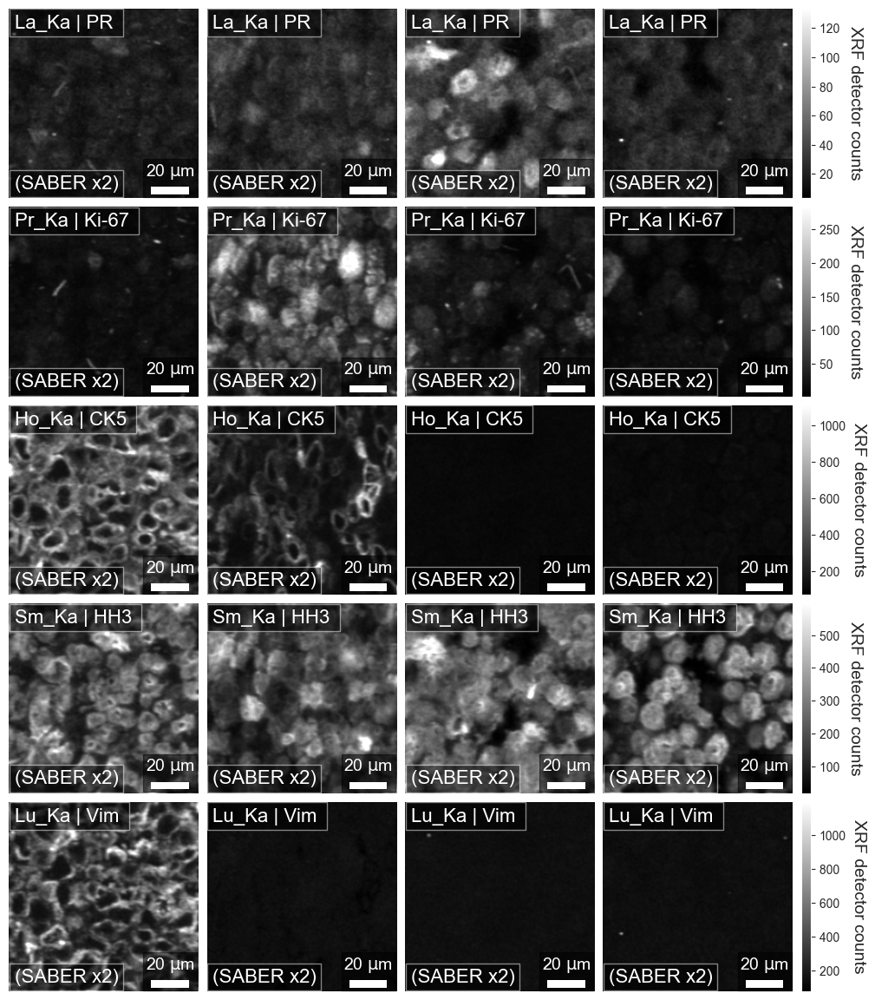

In [30]:
hph_adata.adata_hph_channels_plot(
    adata_CPspeed, 
    plot_name='longname',
    plot_name_split='(',
    plot_channels=sup_channels_speed,
    hdf_ids = [
        'MCF10a 10 Hz',
        'A431 10 Hz',
        'ZR-75-1 10 Hz',
        'SKBR3 10 Hz',     
    ],
    hdf_image_key='raw',
    scale_length=20,
    legend_fontsize=16,
#     save_name=save_name
    #power=2
)

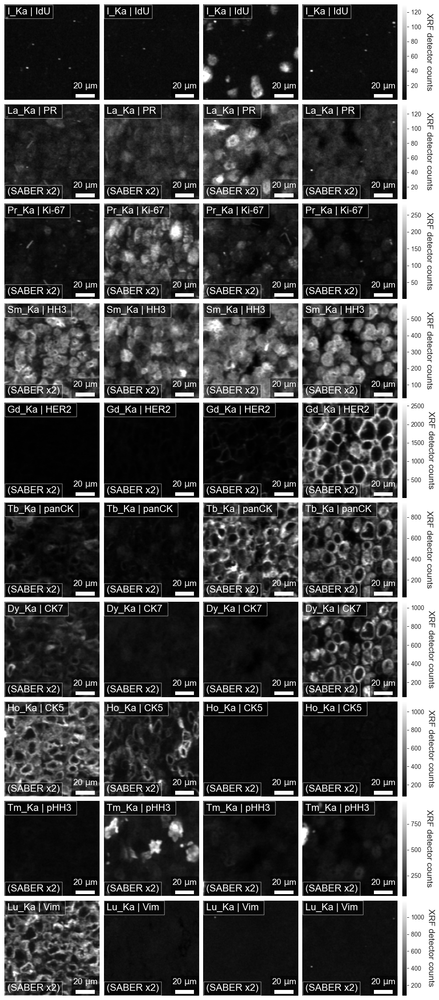

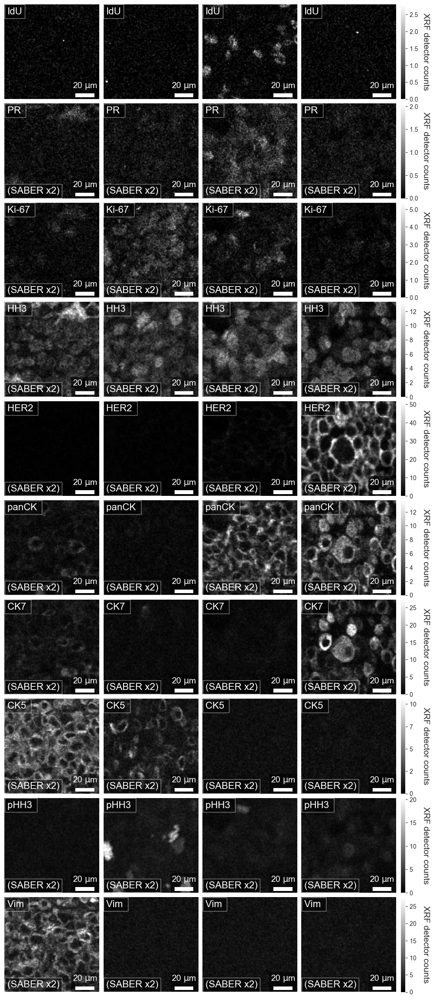

In [31]:
adata_CPspeed_channels = [
    'I_Ka',
    'La_Ka',
    'Pr_Ka',
    'Sm_Ka',
    'Gd_Ka',
    'Tb_Ka',
    'Dy_Ka',
    'Ho_Ka',
    'Tm_Ka',
    'Lu_Ka',
#     'Ir_L3',
]

hph_adata.adata_hph_channels_plot(
    adata_CPspeed, 
    plot_name='longname',
    plot_name_split='(',
    plot_channels=adata_CPspeed_channels,
    hdf_ids = [
        'MCF10a 10 Hz',
        'A431 10 Hz',
        'ZR-75-1 10 Hz',
        'SKBR3 10 Hz',     
    ],
    hdf_image_key='raw',
    scale_length=20,
    legend_fontsize=16,
    #power=2
)

hph_adata.adata_hph_channels_plot(
    adata_CPspeed, 
    plot_name='shortname', 
    plot_name_split='(',
    plot_channels=adata_CPspeed_channels,
    hdf_ids = [
        'MCF10a 800 Hz',
        'A431 800 Hz',
        'ZR-75-1 800 Hz',
        'SKBR3 800 Hz',     
    ],
    hdf_image_key='raw',
    scale_length=20,
    legend_fontsize=16,
    #power=2
)

## 7. Signal to noise, cell pellet speed

In [32]:
# Create cell pellet speed adata
hdf_filepaths = hdf_filepaths_CPspeed
for hdf_fpath in hdf_filepaths[:1]:
    with h5py.File(hdf_fpath, 'r') as hdf:
        print(hdf['images'].keys())
        print(hdf['masks'].keys())
        
image_n = 'raw'
mask_n = 'matched_cell_mask'
adata_CPspeed = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata_CPspeed.obs['Hz'] = adata_CPspeed.obs['hph_id'].str.split(' ', expand=True).iloc[:,-2]
adata_CPspeed.write(out_dir.joinpath(f'cell_pellet_speed_for_signal_to_noise_{mask_n}.h5ad'))

adata = adata_CPspeed

adata_var_select = [var_name for var_name in adata.var_names if var_name != 'Ir_L3']
adata = adata[:, adata_var_select]
adata.obs['Hz'] = adata.obs['hph_id'].str.split(' ', expand=True).iloc[:,-2]#rename(columns = )


df_to_map = adata.var
df_to_map['var_name'] = df_to_map.index
df_to_map[['Symbol', 'Edge']] = df_to_map['var_name'].str.split('_', expand=True).rename(columns={0:'Symbol', 1:'Edge'})
df_to_map = pd.merge(df_to_map, df_periodic_table[['AtomicNumber', 'Element', 'Symbol']], on='Symbol')

df_signal_to_noise = pd.DataFrame()
for hz in adata.obs['Hz'].unique():
    row = {}
    row['Hz'] = hz
    adata_Hz = adata[adata.obs['Hz'] == hz]
    for var_name in adata_Hz.var_names:
        row['var_name'] = var_name

        var_values = adata_Hz[:,var_name].X

        # Sample the max and mean signal in top and bottom (specified) % of cells
        non_zero_values = sorted(var_values[np.nonzero(var_values)])
        percentage = 1
        cell_sample = int(len(non_zero_values) / 100) * percentage
        row['minval'] = np.mean(non_zero_values[:cell_sample])
        row['maxval'] = np.max(non_zero_values[-cell_sample:])

        # Add rows to dataframe
        if df_signal_to_noise.empty:
            df_signal_to_noise = pd.DataFrame(columns=row.keys())            
        df_signal_to_noise = df_signal_to_noise.append(row, ignore_index=True)
            
# Sort data types
df_signal_to_noise['var_name'] = df_signal_to_noise['var_name'].astype('category')
df_signal_to_noise['Hz'] = df_signal_to_noise['Hz'].astype('category')
df_signal_to_noise['minval'] = df_signal_to_noise['minval'].astype('float')
df_signal_to_noise['maxval'] = df_signal_to_noise['maxval'].astype('float')
df_signal_to_noise['signal-to-noise'] = df_signal_to_noise['maxval'] - df_signal_to_noise['minval']
df_signal_to_noise = pd.merge(df_signal_to_noise, df_to_map, on='var_name')

<KeysViewHDF5 ['1_compton_norm', '2_beam_intensity_norm', 'df_channel_metadata', 'raw']>
<KeysViewHDF5 ['fpico_mask', 'matched_cell_mask', 'matched_non_nuclei_mask', 'matched_nuclei_mask', 'mesmer_cell_mask', 'mesmer_nuclei_mask']>


... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'Hz' as categorical
... storing 'shortname' as categorical
Trying to set attribute `.obs` of view, copying.


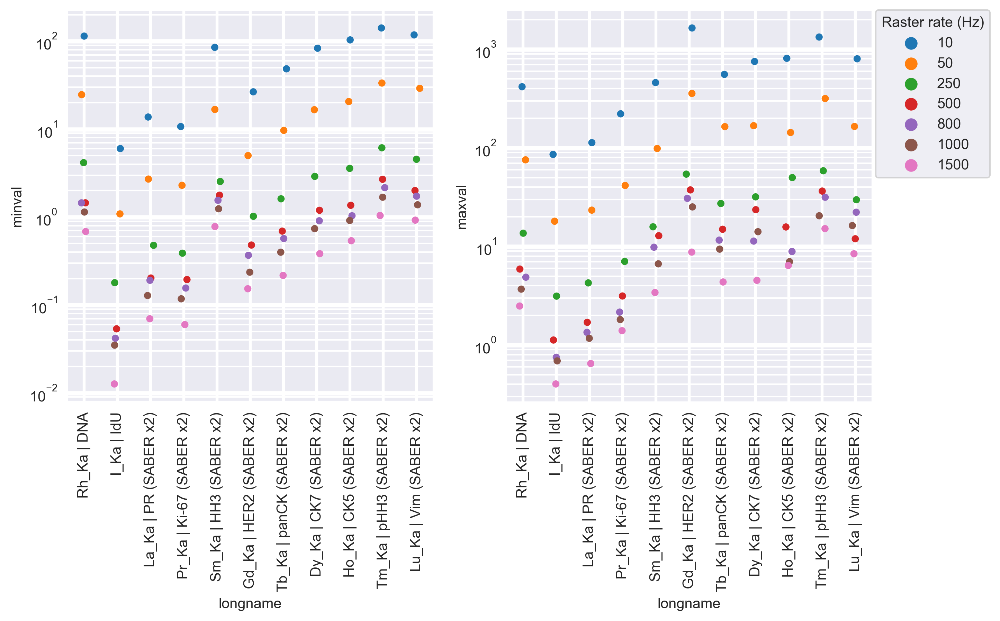

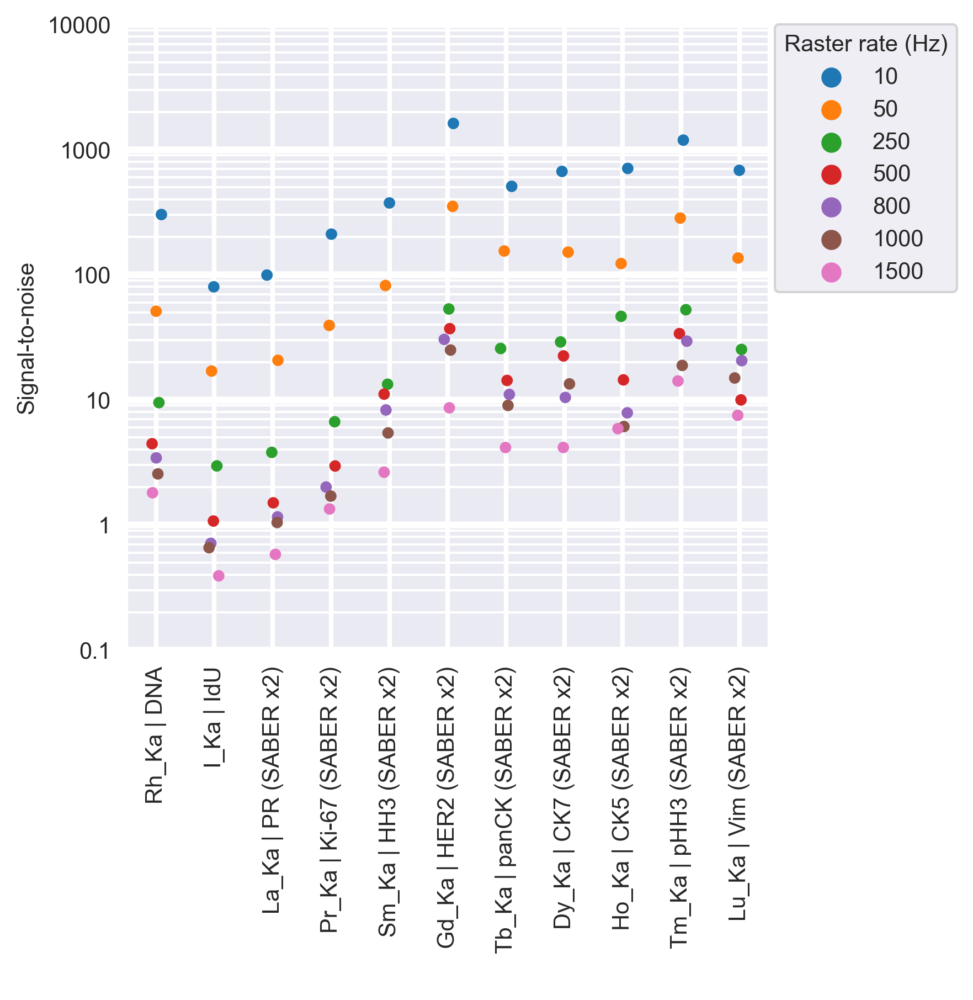

In [33]:
# Set seaborn
from matplotlib.ticker import ScalarFormatter
import matplotlib.ticker as ticker

sns.set_style("dark")

### Check max and min values
fig, axs = plt.subplots(ncols = 2, figsize=(10,5), dpi=300)

g = sns.stripplot(
    data = df_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'minval',
    hue='Hz',
    hue_order = ['10', '50', '250', '500', '800', '1000', '1500'],
    ax=axs[0],
)
axs[0].tick_params(axis='x', rotation=90)

# Set scale
g.set(yscale="log")
#Set gridlines
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')

g = sns.stripplot(
    data = df_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'maxval',
    hue='Hz',
    hue_order = ['10', '50', '250', '500', '800', '1000', '1500'],
    ax=axs[1],
)
axs[1].tick_params(axis='x', rotation=90)


# Set scale
g.set(yscale="log")
#Set gridlines
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')

# Sort shared legend
axs[0].get_legend().remove()
axs[1].get_legend().remove()
plt.legend(title='Raster rate (Hz)', bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=90)#, ha='right')
plt.show()

### Plot signal to noise
fig, ax = plt.subplots(figsize=(5,5), dpi=300)
g = sns.stripplot(
    data = df_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'signal-to-noise',
    hue='Hz',
    hue_order = ['10', '50', '250', '500', '800', '1000', '1500'],
    ax=ax
)
ax.set(yscale="log")
ax.set_ylim([0.1,10000])
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')
plt.xticks(rotation=90)#, ha='right')
plt.ylabel('Signal-to-noise')
plt.xlabel(' ')
plt.legend(title='Raster rate (Hz)', bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.show()